# Pattern Recognition 3 - Points and Neighbourhoods

**Objectives**:

* Detect points of interest in an image
* Extract neighbourhood descriptors
* Use descriptors for clustering and matching

## Points of interest

In the previous labs, we have analyzed the images either using "object descriptors" (area, eccentricity, moments of segmented object) or "image descriptors" (based on all the pixels of the image). Another way of approaching an image analysis problem is to first look for "interesting points".

What makes a point *interesting* will highly depend on the application. Common examples are **corners**, or **local extrema**.

Starting from the `mitosis.bmp` image, find or create a **point detector** that will detect the nuclei of the cells.

> *Hint: it may be easier to do so in a different color space...*

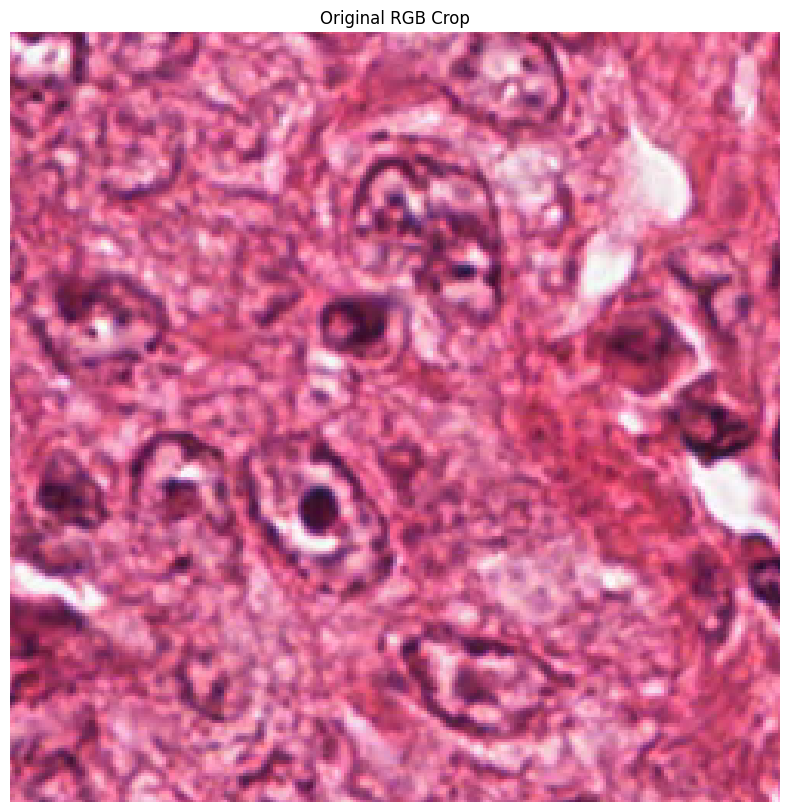

In [4]:
import numpy as np
from matplotlib import pyplot as plt
from skimage.io import imread
%matplotlib inline

im = imread('data/mitosis.bmp')
# show full-color crop
plt.figure(figsize=(10,10))
plt.imshow(im)
plt.xlim([750, 1000])
plt.ylim([1000, 1250])
plt.title("Original RGB Crop")
plt.axis('off')
plt.show()

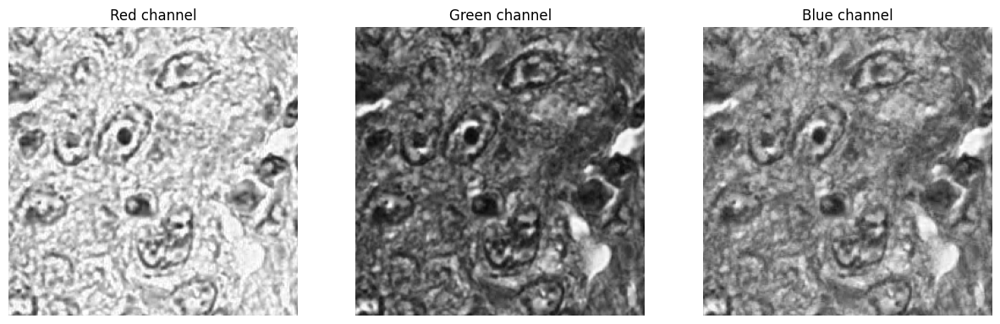

In [6]:
# plot same region with diff color channel
# show each channel
plt.gray()
plt.figure(figsize=(15,5))
for i, chan in enumerate(('Red','Green','Blue')):
    ax = plt.subplot(1,3,i+1)
    ax.imshow(im[...,i])
    ax.set_xlim(750, 1000)
    ax.set_ylim(1250, 1000)  # invert y for correct orientation
    ax.set_title(f"{chan} channel")
    ax.axis('off')
plt.show()

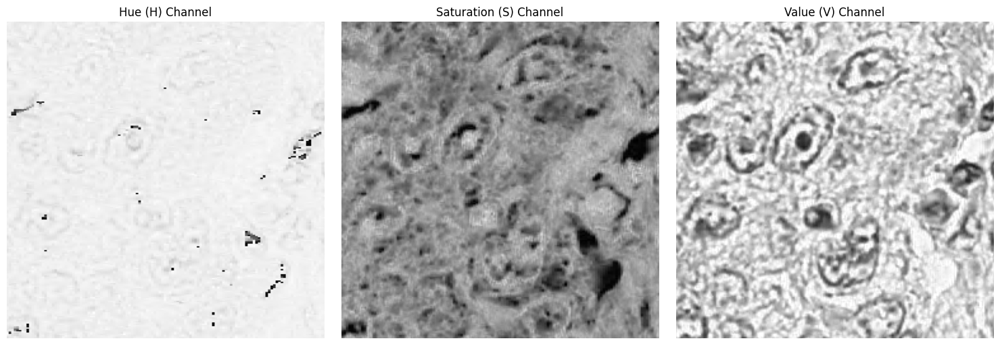

In [17]:
from skimage.color import rgb2hsv

# convert the RGB image to HSV color space
hsv_image = rgb2hsv(im)

# define the cropping region (x: columns, y: rows)
x_start, x_end = 750, 1000
y_start, y_end = 1000, 1250

plt.figure(figsize=(15, 5))

# plot Hue channel
ax1 = plt.subplot(1, 3, 1)
ax1.imshow(hsv_image[..., 0])
ax1.set_title("Hue (H) Channel")
ax1.set_xlim(x_start, x_end)
ax1.set_ylim(y_end, y_start)  # invert y-axis for correct orientation
ax1.axis('off')

# plot Saturation channel
ax2 = plt.subplot(1, 3, 2)
ax2.imshow(hsv_image[..., 1])
ax2.set_title("Saturation (S) Channel")
ax2.set_xlim(x_start, x_end)
ax2.set_ylim(y_end, y_start)
ax2.axis('off')

# plot Value channel
ax3 = plt.subplot(1, 3, 3)
ax3.imshow(hsv_image[..., 2])
ax3.set_title("Value (V) Channel")
ax3.set_xlim(x_start, x_end)
ax3.set_ylim(y_end, y_start)
ax3.axis('off')

plt.tight_layout()
plt.show()

# red and value channel seem to highlight most of the information

In [18]:
# detect point of interest with blood detection using Laplacian of Gaussian
from skimage.feature import blob_log

value_channel   = hsv[..., 2]
inverted_value  = 1 - value_channel

# detect blobs (points of interest) using Laplacian of Gaussian
blobs = blob_log(inverted_value, 
                 min_sigma=4, 
                 max_sigma=10, 
                 num_sigma=4, 
                 threshold=0.1)

print(f"Detected {blobs.shape[0]} points of interest")

Detected 6951 points of interest


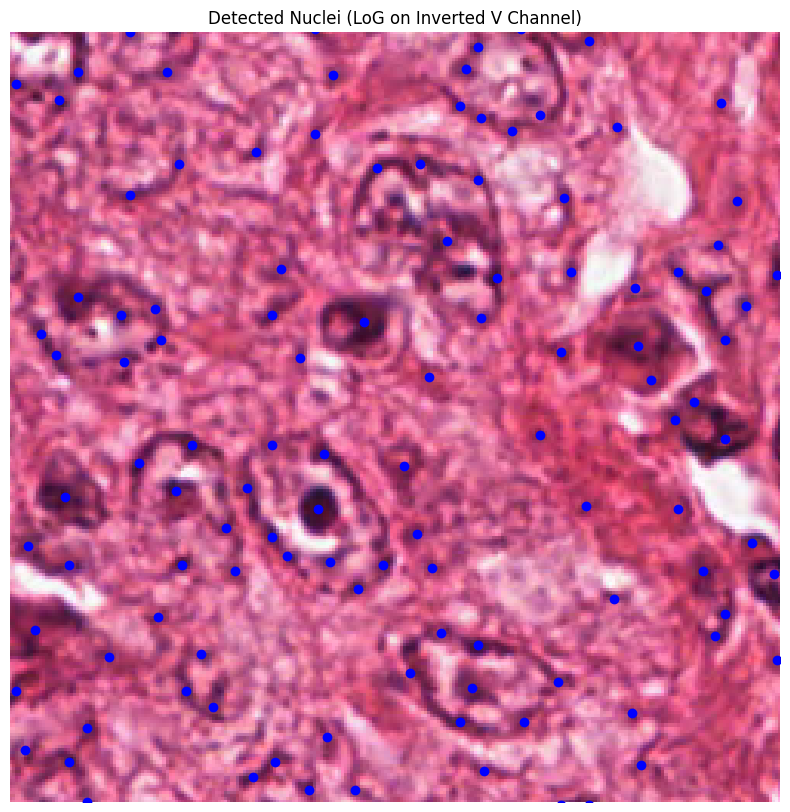

In [23]:
# Plot detection results
plt.figure(figsize=(10,10))
plt.imshow(im)
plt.plot(blobs[:,1], blobs[:,0], 'bo', alpha=1)
plt.xlim([750, 1000])
plt.ylim([1000, 1250])
plt.axis('off')
plt.title("Detected Nuclei (LoG on Inverted V Channel)")
plt.show()

In [25]:
# corner detection
# not the best one in this case because we're interested in the center of the cell

# Peak local maxima
from skimage.feature import peak_local_max
plm = peak_local_max(1-hsv[...,2], min_distance=10, threshold_rel=0.7)
print(f"Detected {len(plm)} local maxima")

Detected 2495 local maxima


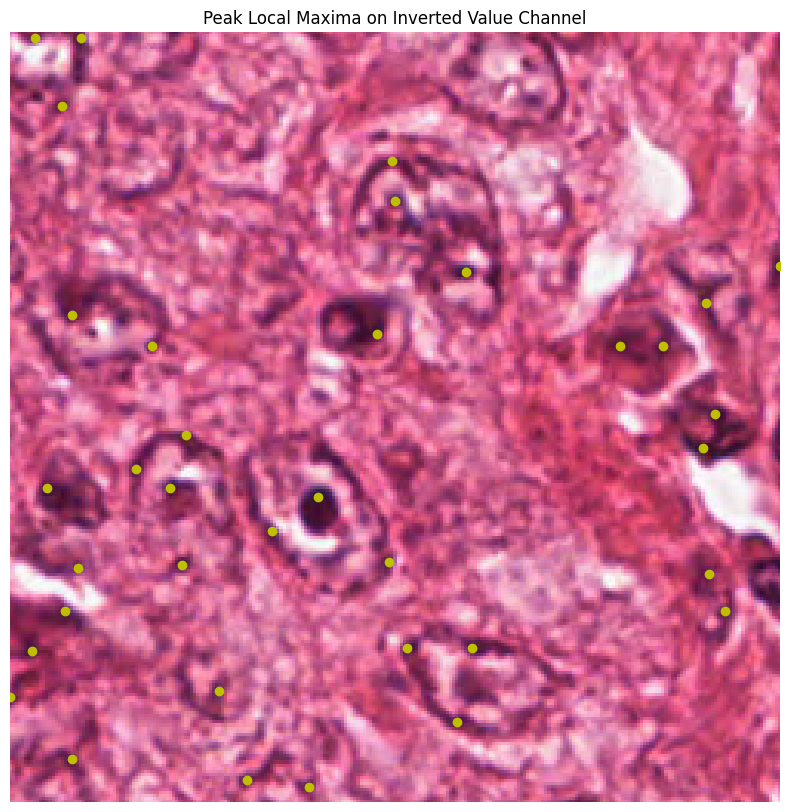

In [26]:
# plot plm results
plt.figure(figsize=(10,10))
plt.imshow(im)
plt.plot(plm[:,1], plm[:,0], 'yo', alpha=1)
plt.xlim([750, 1000])
plt.ylim([1000, 1250])
plt.axis('off')
plt.title("Peak Local Maxima on Inverted Value Channel")
plt.show()

blob_log did not perform well and found dots around the nuclei instead of the nuclei themselves because LoG is really looking for "bright" Gaussian‐shaped bumps (not dark disks) the second‐derivative filter ends up responding strongest at the edges of the nuclei (where the intensity curvature is highest), so we get little rings of detections around each nucleus rather than a single center point.

In contrast, peak_local_max simply finds local extrema in whatever scalar field we give it, so if we threshold and distance‑transform our (inverted) nuclear mask, or even just smooth the inverted intensity, then peak_local_max will single out the true centroid of each blob rather than its rim.

C:\Users\gianm\AppData\Local\Temp\ipykernel_217260\1357441822.py:16: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend(loc='upper right')


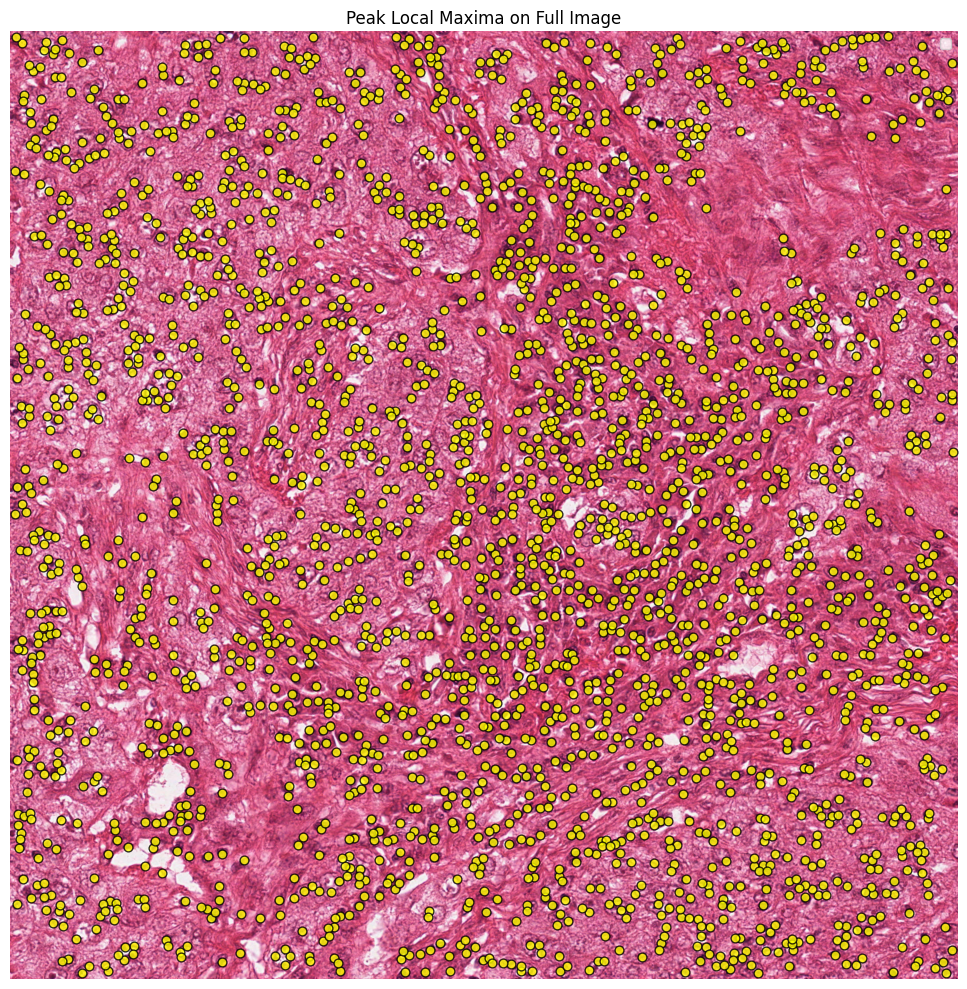

In [37]:
# plot all detected points of interest on the full image
fig, ax = plt.subplots(figsize=(10, 10))
ax.imshow(im, cmap='gray')
ax.set_title("Peak Local Maxima on Full Image")
ax.axis('off')

ax.scatter(
    plm[:, 1],
    plm[:, 0],
    c='yellow',
    edgecolors='black',
    s=40,
    alpha=0.8,
)

ax.legend(loc='upper right')
plt.tight_layout()
plt.show()

## Descriptors

The goal of *descriptors* is to represent the region surrounding the point of interest in a way that allow our algorithm to best perform its task. For instance, the BRIEF descriptor will compare pairs of pixels in the given neighbourhood and create a binary descriptor representing the result of all these comparison. This kind of descriptor will tend to create a unique signature in a grayscale image, and is very useful for applications such as matching for stereo-vision or for video tracking.

Other types of descriptors can be based on the texture (for instance with local Fourier transforms) or on local histograms.

* Using the points detected before, **extract neighbourhood patches** and **compute the concatenated color histogram** as a descriptor (meaning a 256+256+256 = size 768 vector, with the first 256 values corresponding to the R histogram, etc...).
* Use the [KMeans](http://scikit-learn.org/stable/modules/generated/sklearn.cluster.KMeans.html) class from `scikit-learn` to cluster the points of interest depending on their descriptor. Can you identify clusters representing the type of tissue of the cell?

In [39]:
def compute_histogram(patch):
    """
    Compute a concatenated 256-bin histogram for each RGB channel.
    """
    rgb_histogram = np.zeros((768,))
    
    for v in range(256):
        rgb_histogram[v] = (patch[...,0]==v).sum()
        rgb_histogram[v+256] = (patch[...,1]==v).sum()
        rgb_histogram[v+512] = (patch[...,2]==v).sum()
            
    return rgb_histogram

def extract_descriptors(im, coords, neighbourhood_size=15):
    """
    For each (row, col) keypoint, extract a square patch around it
    and compute its RGB histogram descriptor.
    """
    descriptors = []
    for row, col in coords:
        region = im[row-neighbourhood_size//2:row+neighbourhood_size//2, col]
        descriptors.append(compute_histogram(region))
        
    return np.array(descriptors)

descriptors = extract_descriptors(im, plm)
print("Descriptor matrix shape:", descriptors.shape)

Descriptor matrix shape: (2495, 768)


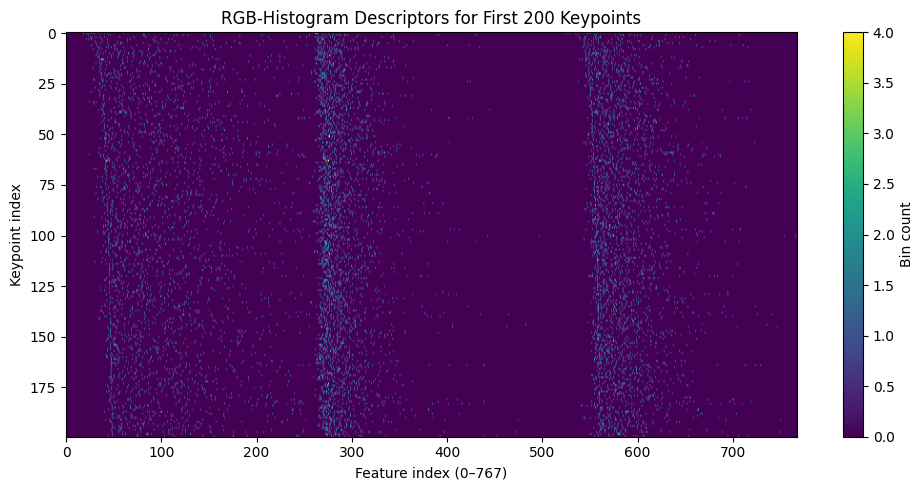

In [40]:
# plot
plt.figure(figsize=(10, 5))
plt.imshow(
    descriptors[:200],       # show first 200 descriptors
    aspect='auto', 
    cmap='viridis'
)
plt.colorbar(label='Bin count')
plt.xlabel("Feature index (0–767)")
plt.ylabel("Keypoint index")
plt.title("RGB‐Histogram Descriptors for First 200 Keypoints")
plt.tight_layout()
plt.show()

In [41]:
# Apply K-means
from sklearn.cluster import KMeans

# cluster descriptors into 2 groups
n_clusters = 2
kmeans = KMeans(n_clusters=n_clusters, random_state=42)
cluster_labels = kmeans.fit_predict(descriptors)

# report how many keypoints per cluster
unique_labels, counts = np.unique(cluster_labels, return_counts=True)
for lbl, cnt in zip(unique_labels, counts):
    print(f"Cluster {lbl}: {cnt} keypoints")

Cluster 0: 1103 keypoints
Cluster 1: 1392 keypoints


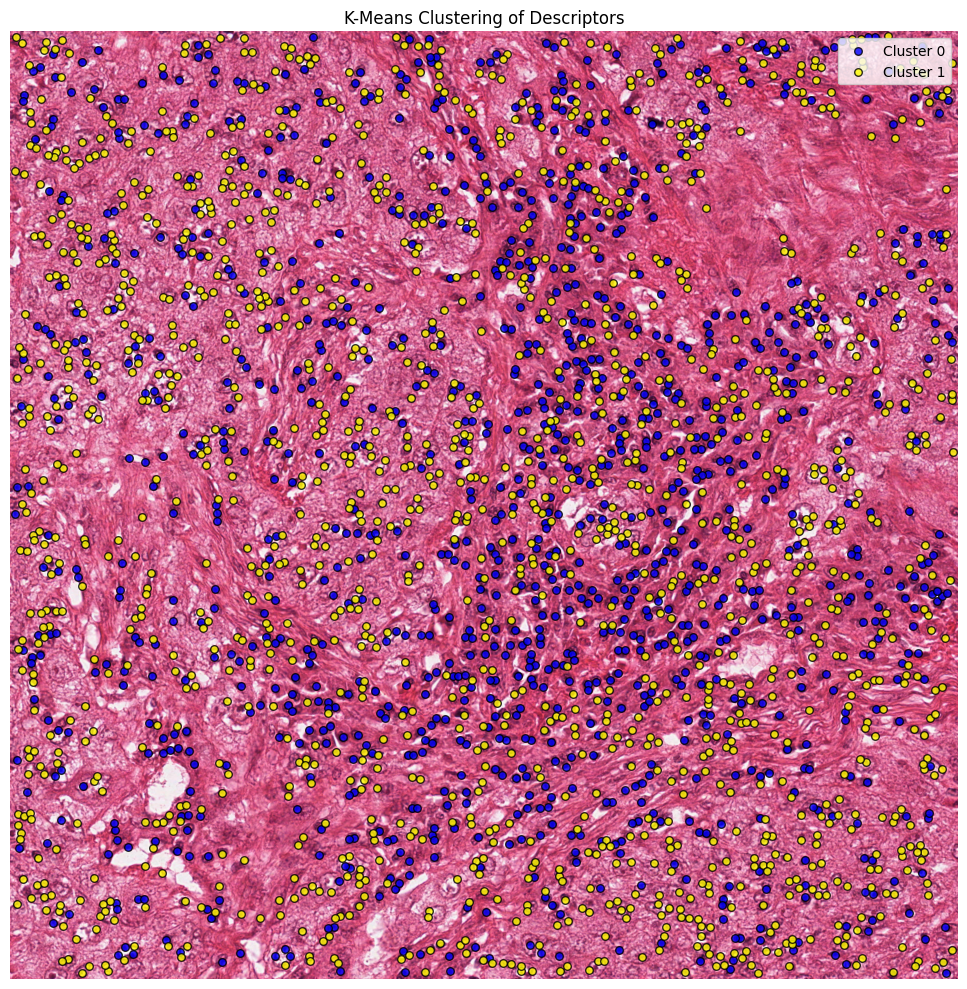

In [42]:
# visualize clustered keypoints on the image
fig, ax = plt.subplots(figsize=(10, 10))
ax.imshow(im)
ax.set_title("K-Means Clustering of Descriptors")
ax.axis('off')

colors = ['blue', 'yellow']
for lbl in unique_labels:
    mask = (cluster_labels == lbl)
    ax.scatter(
        plm[mask, 1],
        plm[mask, 0],
        c=colors[lbl], 
        label=f'Cluster {lbl}',
        s=30,
        alpha=0.8,
        edgecolors='black'
    )

ax.legend(loc='upper right')
plt.tight_layout()
plt.show()

* Apply the same point detection and descriptors on the `mitosis2.bmp` image, and use the already trained KMeans to predict the clusters of the points in the new image.

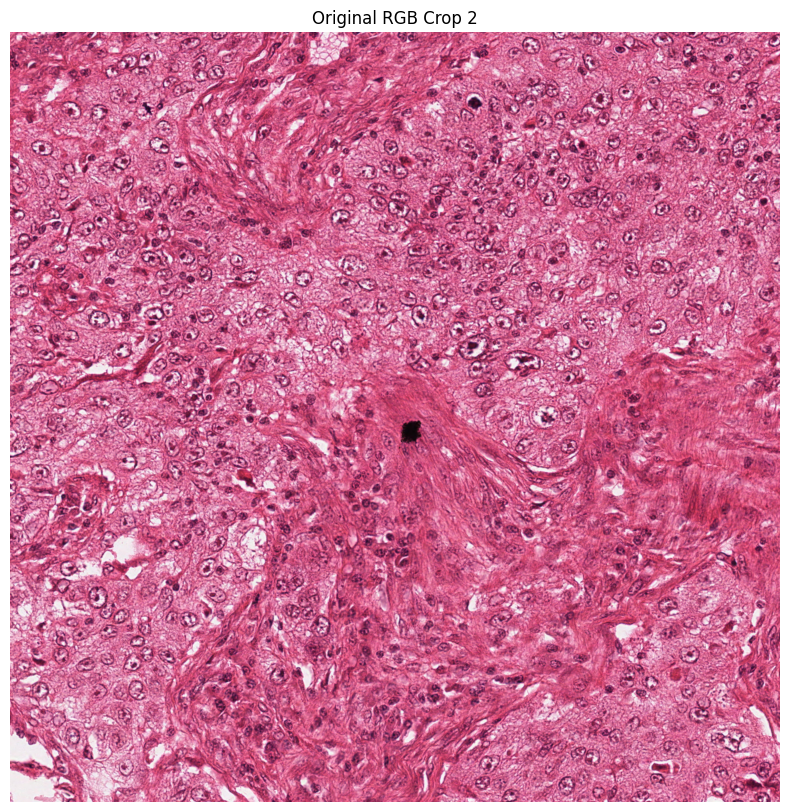

In [44]:
%matplotlib inline

im2 = imread('data/mitosis2.bmp')
plt.figure(figsize=(10,10))
plt.imshow(im2)
plt.title("Original RGB Crop 2")
plt.axis('off')
plt.show()

In [48]:
hsv2 = rgb2hsv(im2)
value2 = hsv2[..., 2]
plm2 = peak_local_max(value2, 
                     min_distance=10, 
                     threshold_rel=0.7)

print(f"Detected {len(plm2)} local maxima")

Detected 15359 local maxima


In [50]:
descriptors_im2 = extract_descriptors(im2, plm2)
print("Descriptor matrix shape:", descriptors_im2.shape)

Descriptor matrix shape: (15359, 768)


In [51]:
cluster_labels_im2 = kmeans.fit_predict(descriptors_im2)

# report how many keypoints per cluster
unique_labels, counts = np.unique(cluster_labels_im2, return_counts=True)
for lbl, cnt in zip(unique_labels, counts):
    print(f"Cluster {lbl}: {cnt} keypoints")

Cluster 0: 3517 keypoints
Cluster 1: 11842 keypoints


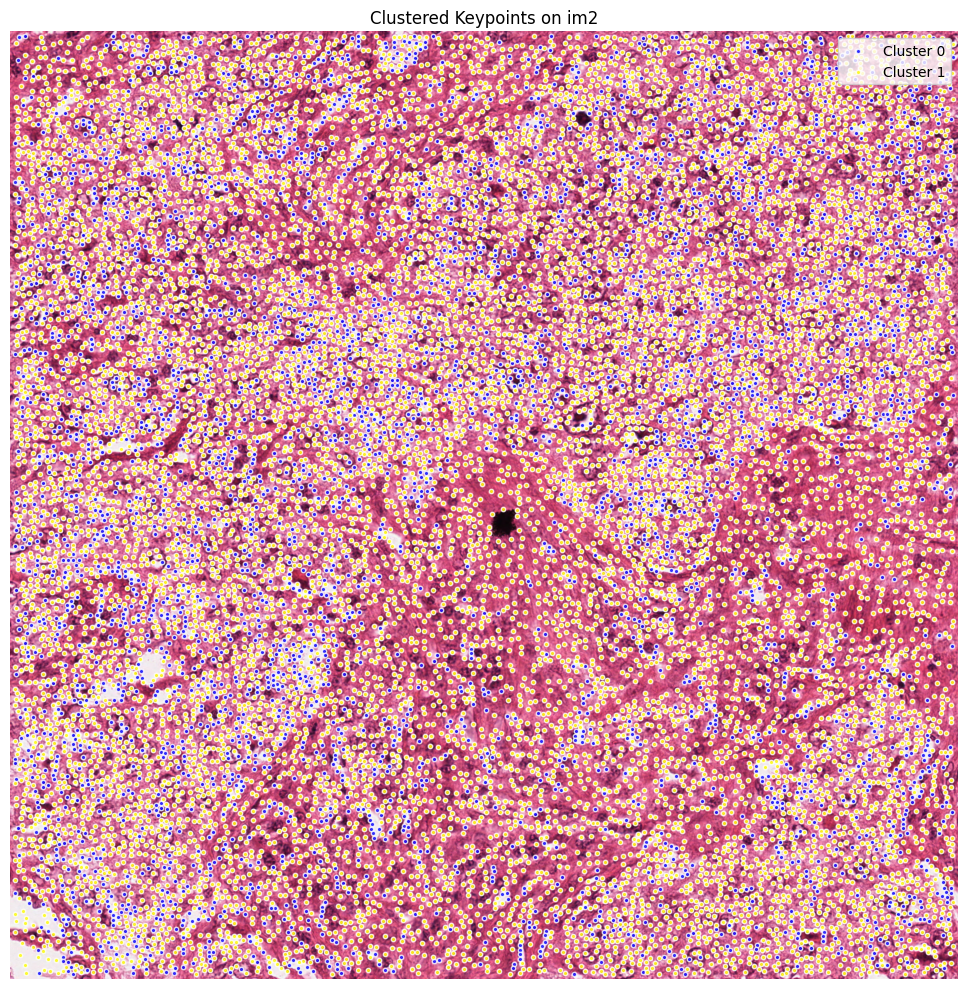

In [56]:
# visualize the clustered keypoints overlaid on the full image
fig, ax = plt.subplots(figsize=(10, 10))
ax.imshow(im2)
ax.set_title("Clustered Keypoints on im2")
ax.axis('off')

colors = ['blue', 'yellow']
for lbl in np.unique(cluster_labels_im2):
    mask = (cluster_labels_im2 == lbl)
    ax.scatter(
        plm2[mask, 1],
        plm2[mask, 0],
        c=colors[lbl],
        label=f'Cluster {lbl}',
        s=10,
        alpha=0.8,
        edgecolors='white'
    )

ax.legend(loc='upper right')
plt.tight_layout()
plt.show()